<a href="https://colab.research.google.com/github/Amdzak/PCVK-Tugas-Kelompok/blob/main/Tugas_Kelompok_Buah.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bagian A – Observasi & Eksperimen


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.

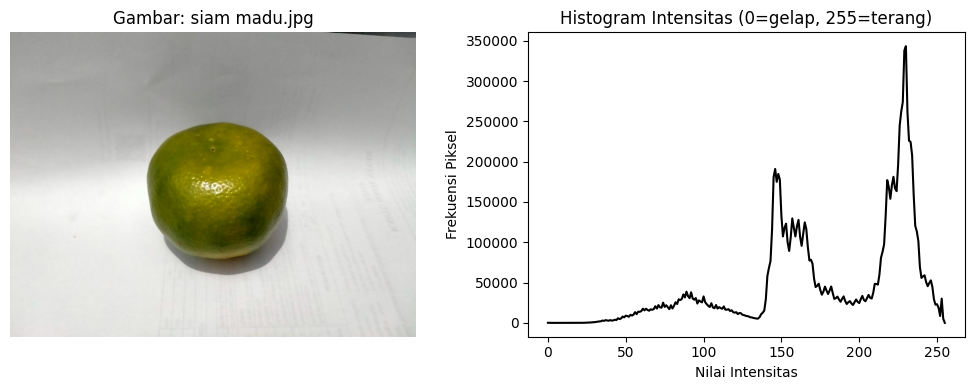

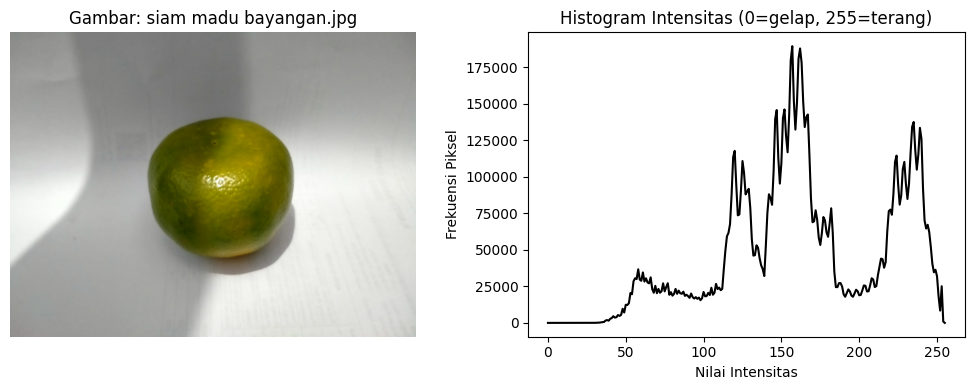

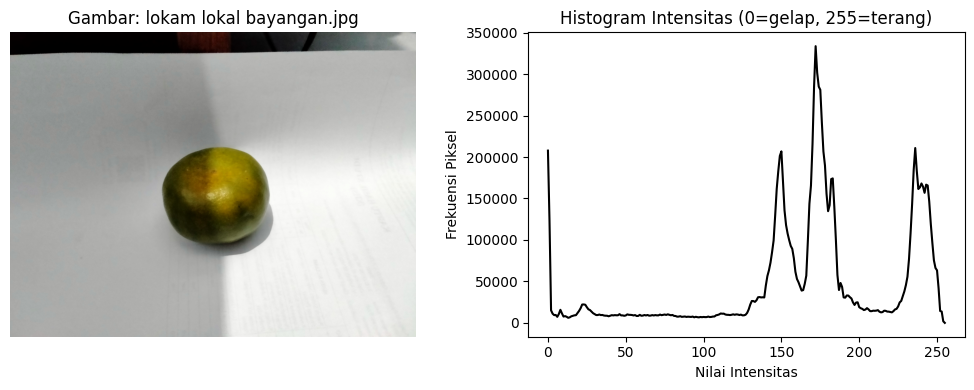

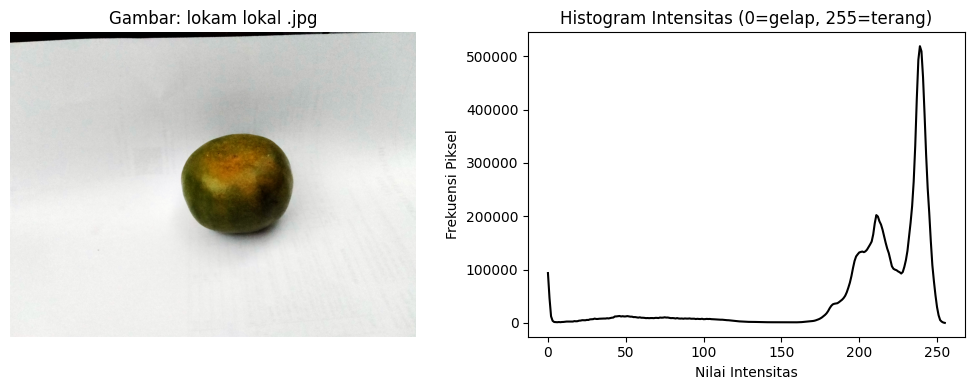

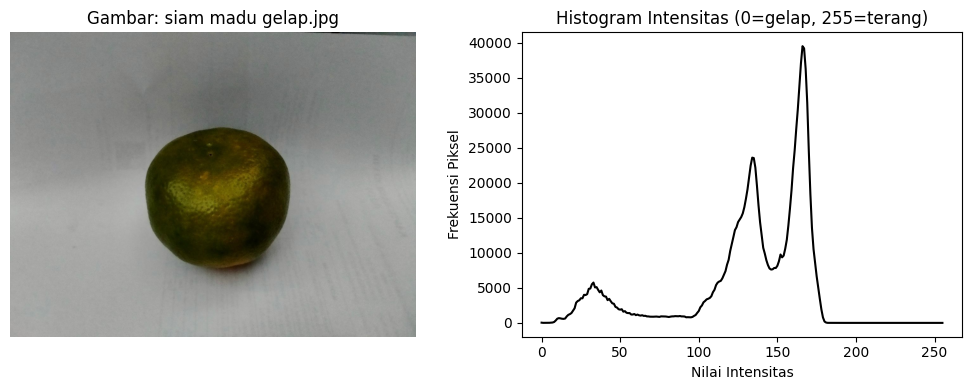

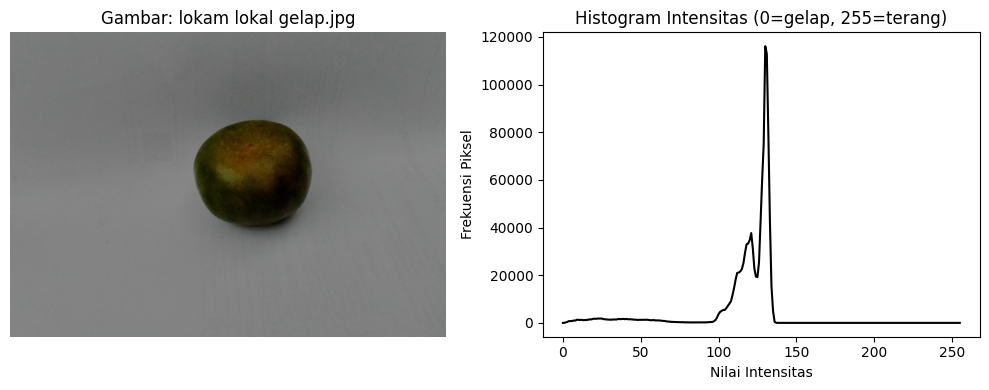

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from google.colab import drive

# folder_path = '/content/drive/MyDrive/POLINEMA_Putri Nadhiyah Salsabila_4M/PCVK/Gambar Tugas Kelompok'
folder_path = '/content/drive/MyDrive/PCVK/Gambar Tugas Kelompok'

# Fungsi menampilkan gambar & histogram
def show_histogram(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray], [0], None, [256], [0,256])

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Gambar: {os.path.basename(image_path)}')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.plot(hist, color='black')
    plt.title('Histogram Intensitas (0=gelap, 255=terang)')
    plt.xlabel('Nilai Intensitas')
    plt.ylabel('Frekuensi Piksel')
    plt.tight_layout()
    plt.show()

# Tampilkan semua gambar di folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]

for file in image_files:
    full_path = os.path.join(folder_path, file)
    show_histogram(full_path)


## 2. Terapkan transformasi brightness dan contrast (linear/log brightness).
- Tentukan nilai b (brightness) dan a (contrast) yang sesuai.

/tmp/ipython-input-1908164826.py:40: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray_asli.ravel(), 256, [0,256], color='gray', label='Asli', alpha=0.6)
/tmp/ipython-input-1908164826.py:41: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray_bc.ravel(), 256, [0,256], color='blue', label='Setelah BC', alpha=0.6)


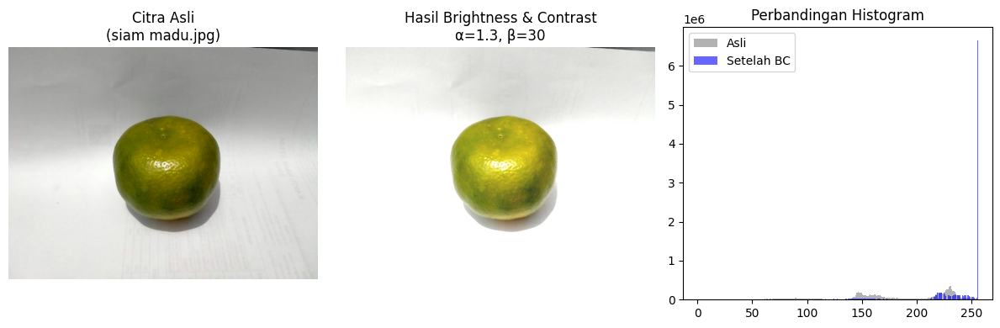

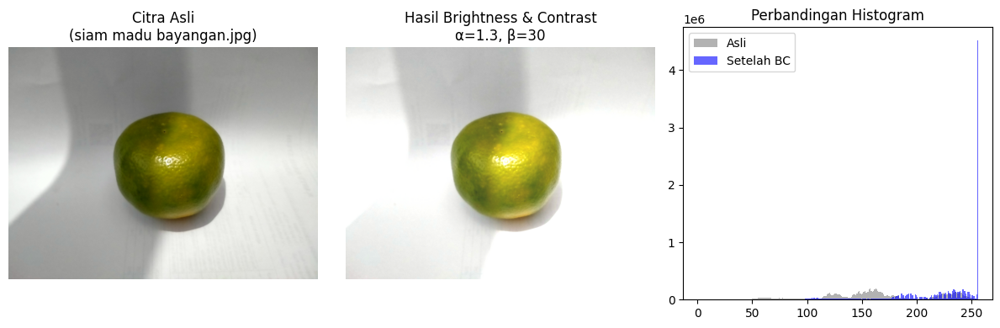

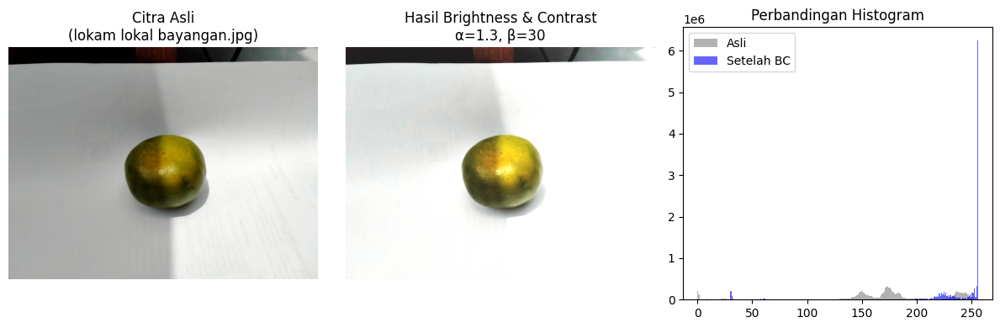

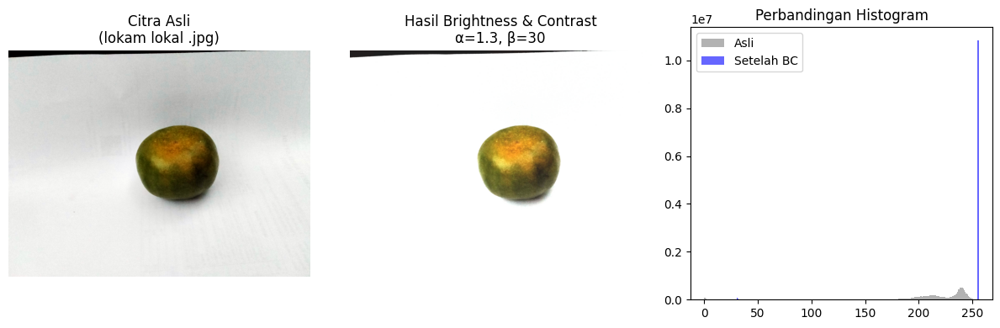

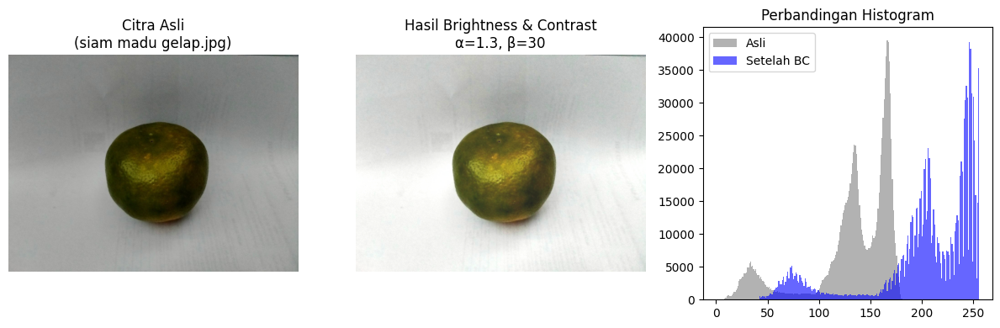

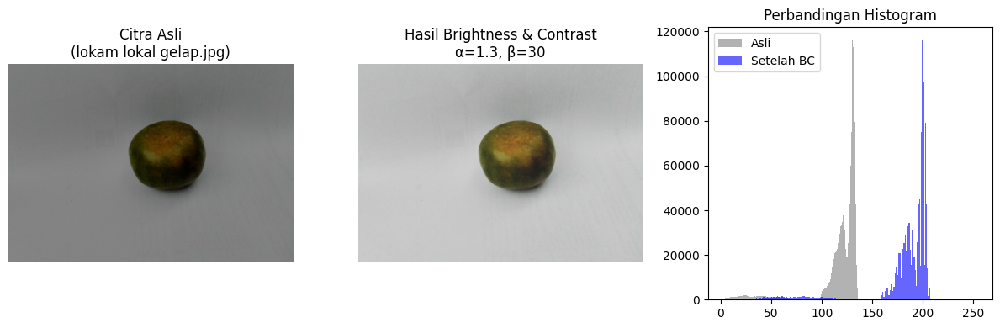

In [ ]:
# @title
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

# Folder gambar kamu
# folder_path = '/content/drive/MyDrive/POLINEMA_Putri Nadhiyah Salsabila_4M/PCVK/Gambar Tugas Kelompok'
folder_path = '/content/drive/MyDrive/PCVK/Gambar Tugas Kelompok'

# Fungsi untuk menyesuaikan brightness & contrast (pada gambar berwarna)
def adjust_brightness_contrast(image, alpha, beta):
    # alpha: contrast, beta: brightness
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

# Fungsi menampilkan perbandingan gambar sebelum & sesudah (berwarna)
def show_bc(image_path, alpha, beta):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_bc = adjust_brightness_contrast(img_rgb, alpha, beta)

    plt.figure(figsize=(12,4))

    # 1️⃣ Gambar asli
    plt.subplot(1,3,1)
    plt.imshow(img_rgb)
    plt.title(f'Citra Asli\n({os.path.basename(image_path)})')
    plt.axis('off')

    # 2️⃣ Gambar hasil BC (berwarna)
    plt.subplot(1,3,2)
    plt.imshow(img_bc)
    plt.title(f'Hasil Brightness & Contrast\nα={alpha}, β={beta}')
    plt.axis('off')

    # 3️⃣ Histogram perbandingan (berdasarkan luminance)
    plt.subplot(1,3,3)
    gray_asli = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    gray_bc = cv2.cvtColor(img_bc, cv2.COLOR_RGB2GRAY)
    plt.hist(gray_asli.ravel(), 256, [0,256], color='gray', label='Asli', alpha=0.6)
    plt.hist(gray_bc.ravel(), 256, [0,256], color='blue', label='Setelah BC', alpha=0.6)
    plt.legend()
    plt.title('Perbandingan Histogram')
    plt.tight_layout()
    plt.show()

# --- Jalankan untuk semua gambar di folder ---
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]

alpha = 1.3   # kontras lebih tinggi sedikit
beta = 30     # brightness ditambah

for file in image_files:
    full_path = os.path.join(folder_path, file)
    show_bc(full_path, alpha, beta)


Analisis Brightness & Contrast:

Nilai α = 1.3, β = 30 memberi hasil pencahayaan yang lebih terang dan kontras yang lebih tajam.

Histogram menunjukkan pergeseran ke kanan (lebih terang) dan rentang distribusi lebih lebar (kontras meningkat).

Detail di area gelap terlihat lebih jelas tanpa kehilangan detail di area terang.

## 3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
- Bandingkan hasil visual dan histogram sebelum–sesudah.

/tmp/ipython-input-249830555.py:37: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img_gray.ravel(), 256, [0,256])
/tmp/ipython-input-249830555.py:41: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(equalized.ravel(), 256, [0,256])


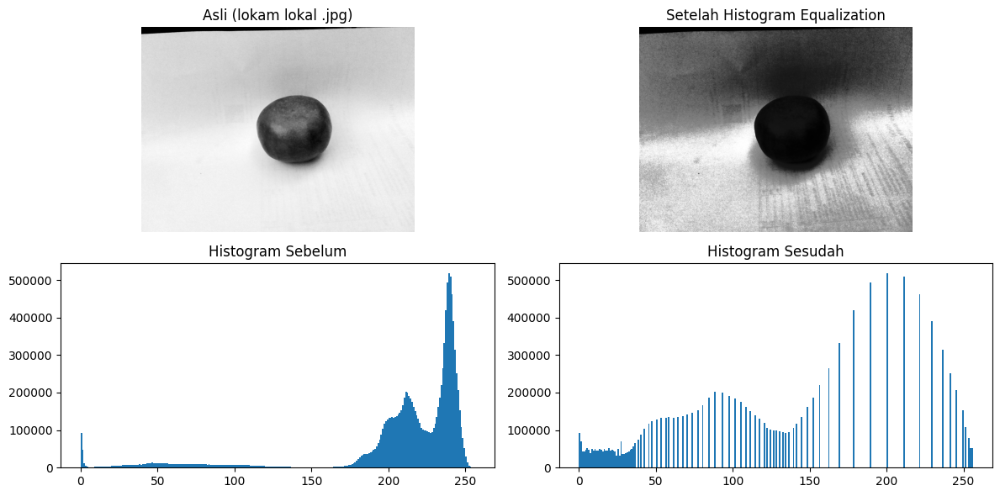

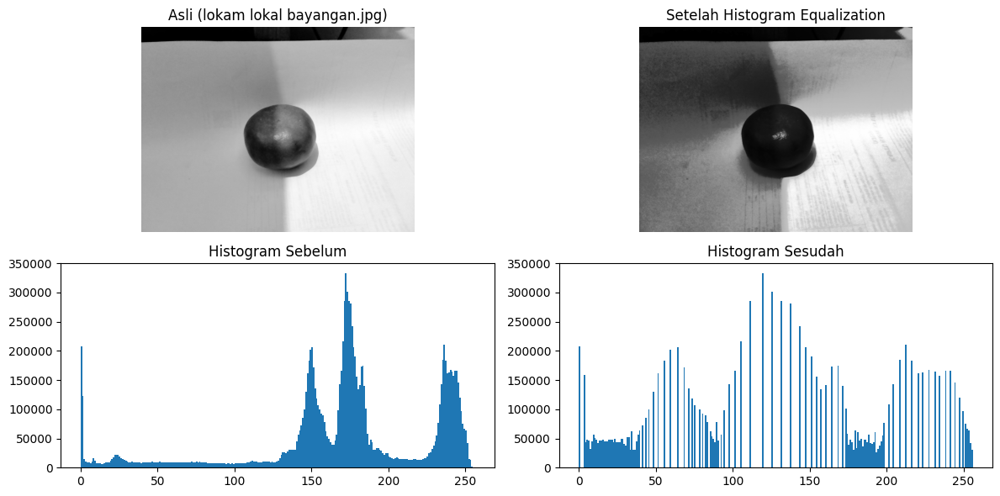

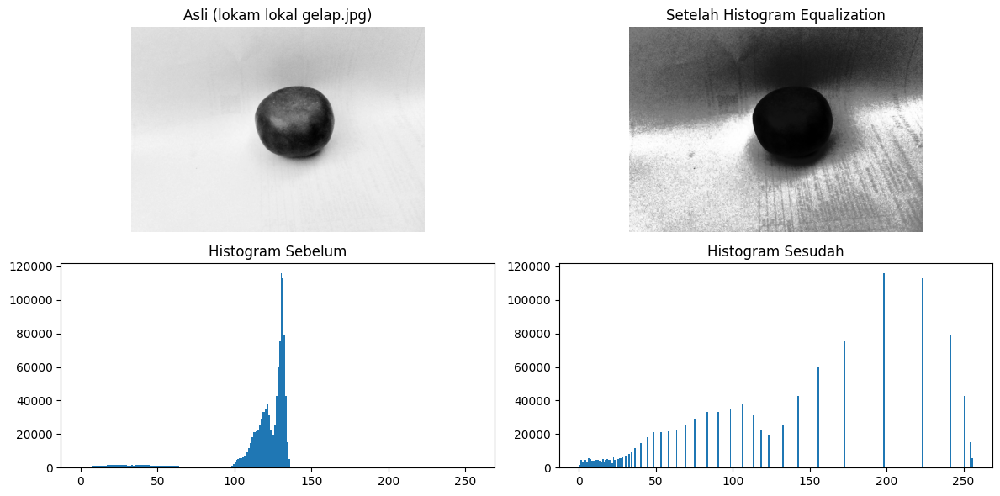

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

path = '/content/drive/MyDrive/PCVK/Gambar Tugas Kelompok/'

files = ['lokam lokal .jpg', 'lokam lokal bayangan.jpg', 'lokam lokal gelap.jpg']

for file in files:
    img_path = path + file
    # 1. Baca citra
    img = cv2.imread(img_path)
    if img is None:
        print(f"Gagal membaca gambar: {img_path}")
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2. Histogram Equalization
    equalized = cv2.equalizeHist(img_gray)

    # 3. Tampilkan perbandingan visual
    plt.figure(figsize=(12,6))
    plt.subplot(2,2,1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f'Asli ({file})')
    plt.axis('off')

    plt.subplot(2,2,2)
    plt.imshow(equalized, cmap='gray')
    plt.title('Setelah Histogram Equalization')
    plt.axis('off')

    # 4. Histogram sebelum–sesudah
    plt.subplot(2,2,3)
    plt.hist(img_gray.ravel(), 256, [0,256])
    plt.title('Histogram Sebelum')

    plt.subplot(2,2,4)
    plt.hist(equalized.ravel(), 256, [0,256])
    plt.title('Histogram Sesudah')

    plt.tight_layout()
    plt.show()


## 4. Terapkan filter spasial:
- Low-pass filter untuk menghaluskan noise.
- High-pass atau Laplacian filter untuk menajamkan tepi

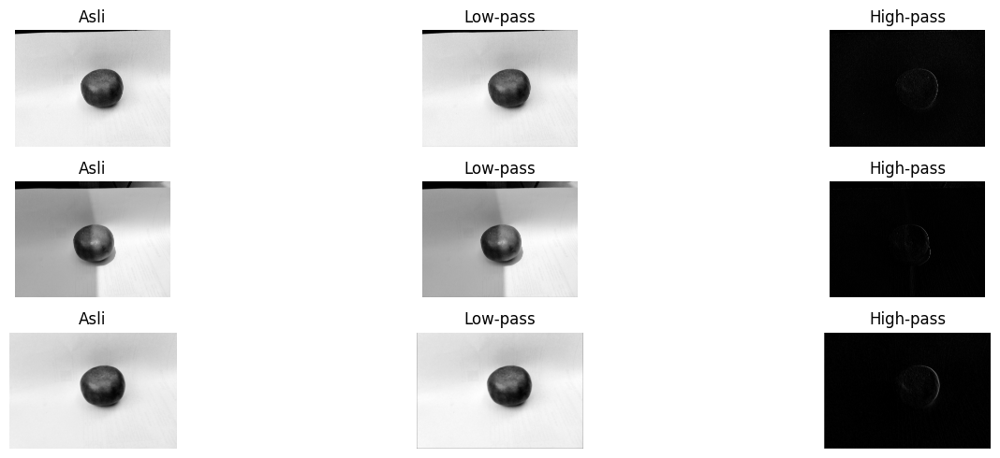

In [12]:
# Kode disini
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ===============================================
# Fungsi konvolusi 2D manual
# ===============================================
def conv2d(image, kernel, stride=1, padding=0):
    if padding > 0:
        image = np.pad(image, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)
    k_h, k_w = kernel.shape
    i_h, i_w = image.shape
    out_h = (i_h - k_h) // stride + 1
    out_w = (i_w - k_w) // stride + 1
    output = np.zeros((out_h, out_w), dtype=np.float32)
    for y in range(out_h):
        for x in range(out_w):
            region = image[y*stride:y*stride+k_h, x*stride:x*stride+k_w]
            output[y, x] = np.sum(region * kernel)
    return np.clip(output, 0, 255).astype(np.uint8)

# ===============================================
# Path dan daftar file
# ===============================================
path = '/content/drive/MyDrive/PCVK/Gambar Tugas Kelompok/'

files = ['lokam lokal .jpg', 'lokam lokal bayangan.jpg', 'lokam lokal gelap.jpg']

# Kernel Low-pass dan High-pass
kernel_low = (1/12) * np.array([
    [1, 1, 1],
    [1, 4, 1],
    [1, 1, 1]
])
kernel_high = np.array([
    [-1, 0, 1],
    [-1, 0, 3],
    [-3, 0, 1]
])

plt.figure(figsize=(15, 5))

for i, file in enumerate(files):
    # Baca gambar dan ubah ke grayscale
    img = cv2.imread(path + file)
    if img is None:
        print(f"Gagal membaca gambar: {file}")
        continue
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Low-pass & High-pass
    low_pass = conv2d(img_gray, kernel_low, stride=1, padding=2)
    high_pass = conv2d(img_gray, kernel_high, stride=1, padding=2)

    # Tampilkan 3 gambar berdampingan
    plt.subplot(len(files), 3, i*3 + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Asli')
    plt.axis('off')

    plt.subplot(len(files), 3, i*3 + 2)
    plt.imshow(low_pass, cmap='gray')
    plt.title('Low-pass')
    plt.axis('off')

    plt.subplot(len(files), 3, i*3 + 3)
    plt.imshow(high_pass, cmap='gray')
    plt.title('High-pass')
    plt.axis('off')

plt.tight_layout()
plt.show()


## 5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman warna(bit- depth 4–6 bit), lalu analisis bagaimana efeknya terhadap detail.


=== Memproses: lokam lokal .jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 675.25
    MSE Dengan Dithering: 1318.58
    PSNR Tanpa Dithering : 19.84 dB
    PSNR Dengan Dithering: 16.93 dB


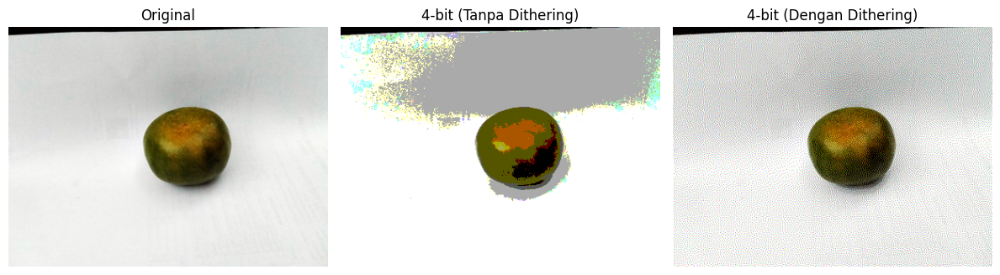


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 156.78
    MSE Dengan Dithering: 250.19
    PSNR Tanpa Dithering : 26.18 dB
    PSNR Dengan Dithering: 24.15 dB


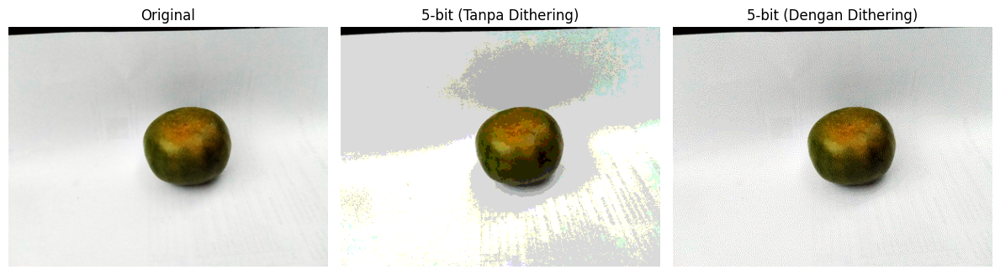


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 20.73
    MSE Dengan Dithering: 38.15
    PSNR Tanpa Dithering : 34.96 dB
    PSNR Dengan Dithering: 32.32 dB


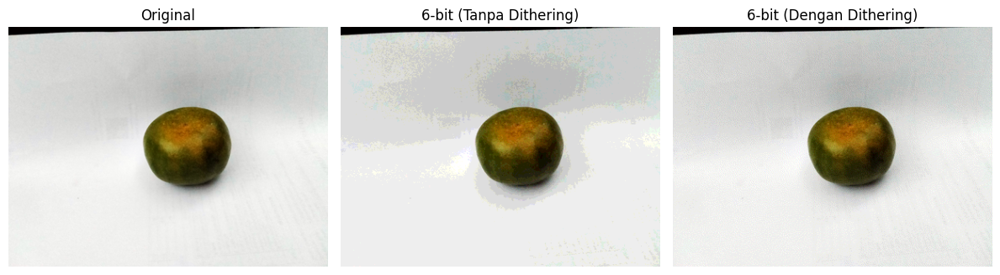


=== Memproses: lokam lokal bayangan.jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 317.85
    MSE Dengan Dithering: 890.00
    PSNR Tanpa Dithering : 23.11 dB
    PSNR Dengan Dithering: 18.64 dB


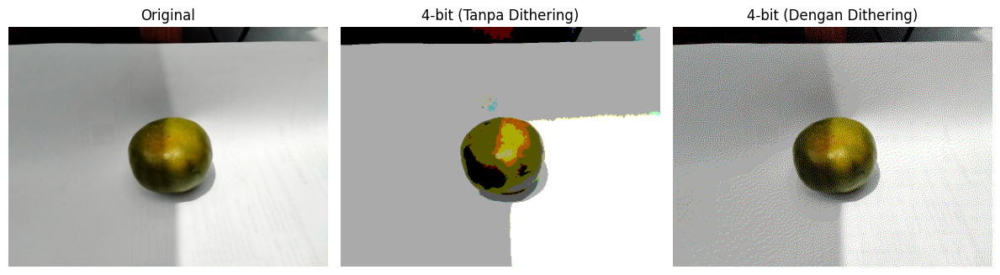


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 106.31
    MSE Dengan Dithering: 208.64
    PSNR Tanpa Dithering : 27.87 dB
    PSNR Dengan Dithering: 24.94 dB


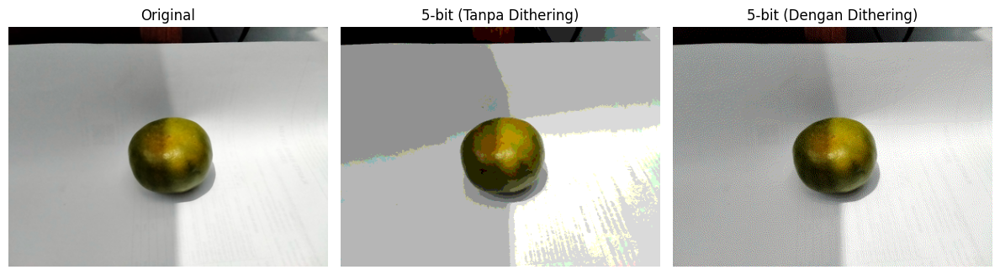


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 21.60
    MSE Dengan Dithering: 41.40
    PSNR Tanpa Dithering : 34.79 dB
    PSNR Dengan Dithering: 31.96 dB


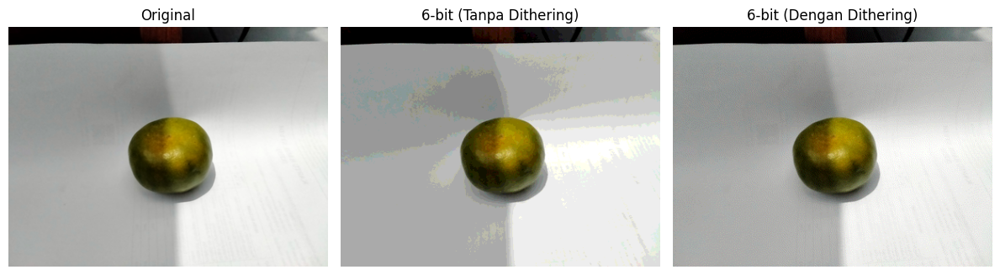


=== Memproses: lokam lokal gelap.jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 1250.82
    MSE Dengan Dithering: 1661.60
    PSNR Tanpa Dithering : 17.16 dB
    PSNR Dengan Dithering: 15.93 dB


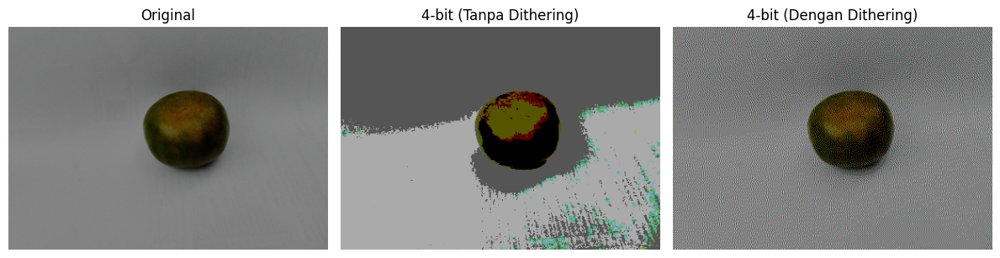


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 156.14
    MSE Dengan Dithering: 255.23
    PSNR Tanpa Dithering : 26.20 dB
    PSNR Dengan Dithering: 24.06 dB


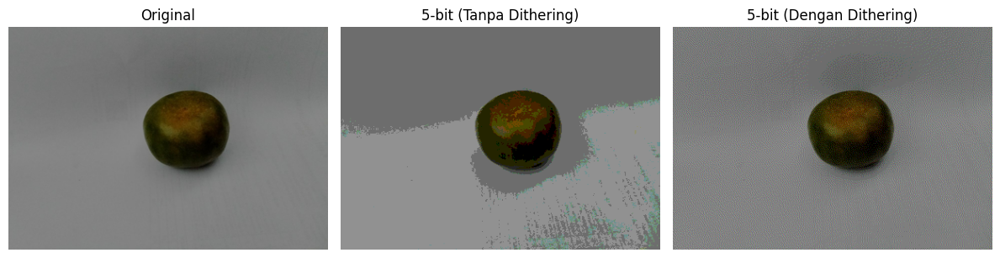


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 27.11
    MSE Dengan Dithering: 49.84
    PSNR Tanpa Dithering : 33.80 dB
    PSNR Dengan Dithering: 31.16 dB


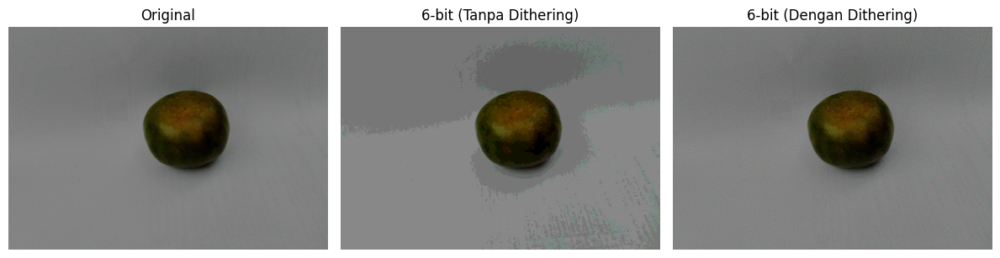


=== Memproses: siam madu.jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 583.79
    MSE Dengan Dithering: 1218.82
    PSNR Tanpa Dithering : 20.47 dB
    PSNR Dengan Dithering: 17.27 dB


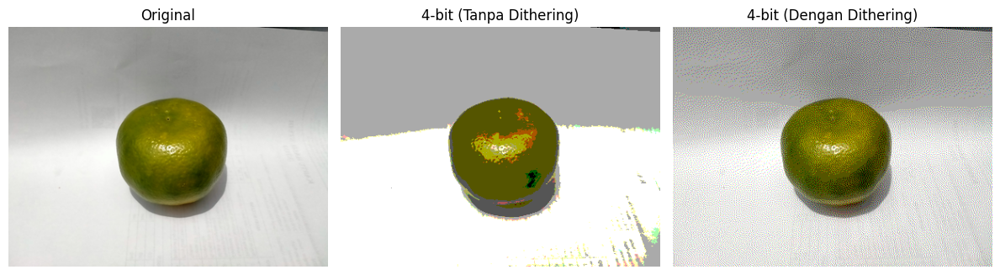


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 103.73
    MSE Dengan Dithering: 197.22
    PSNR Tanpa Dithering : 27.97 dB
    PSNR Dengan Dithering: 25.18 dB


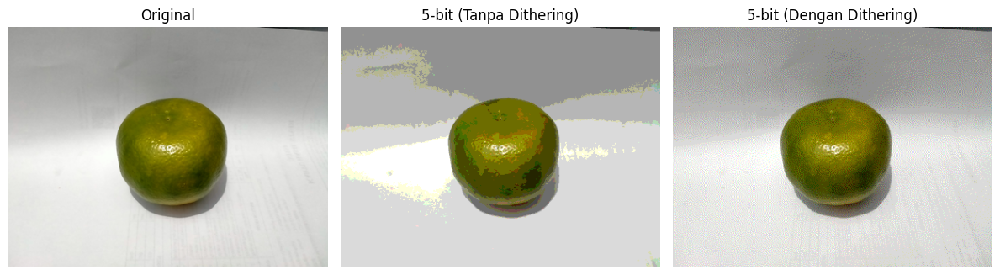


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 25.91
    MSE Dengan Dithering: 45.12
    PSNR Tanpa Dithering : 34.00 dB
    PSNR Dengan Dithering: 31.59 dB


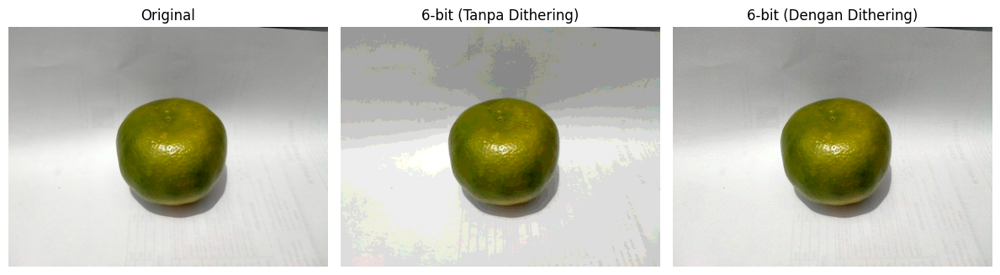


=== Memproses: siam madu gelap.jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 616.35
    MSE Dengan Dithering: 1077.12
    PSNR Tanpa Dithering : 20.23 dB
    PSNR Dengan Dithering: 17.81 dB


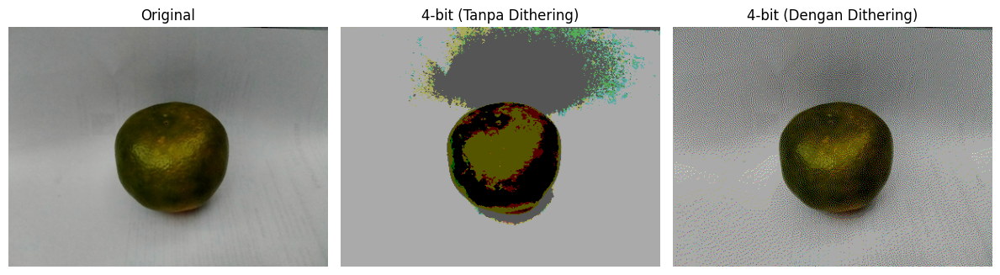


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 148.77
    MSE Dengan Dithering: 246.60
    PSNR Tanpa Dithering : 26.41 dB
    PSNR Dengan Dithering: 24.21 dB


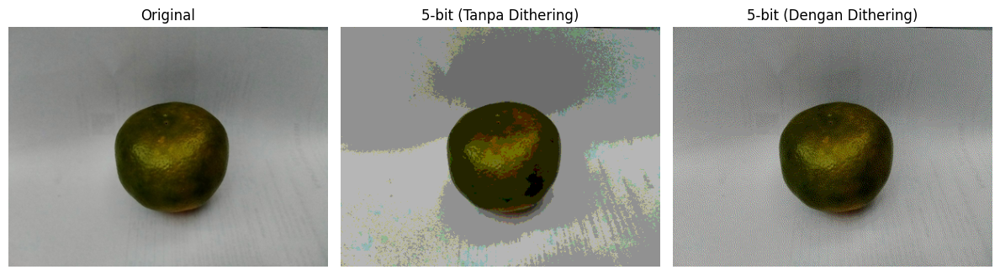


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 22.59
    MSE Dengan Dithering: 41.34
    PSNR Tanpa Dithering : 34.59 dB
    PSNR Dengan Dithering: 31.97 dB


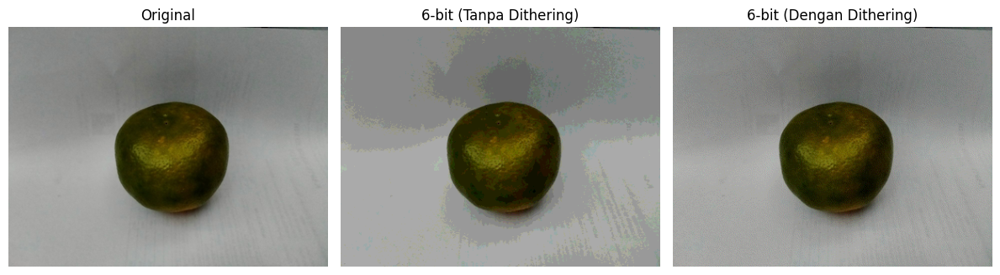


=== Memproses: siam madu bayangan.jpg ===

  → Bit Depth 4-bit (≈ 4 warna/channel)
    MSE Tanpa Dithering : 565.36
    MSE Dengan Dithering: 1141.70
    PSNR Tanpa Dithering : 20.61 dB
    PSNR Dengan Dithering: 17.56 dB


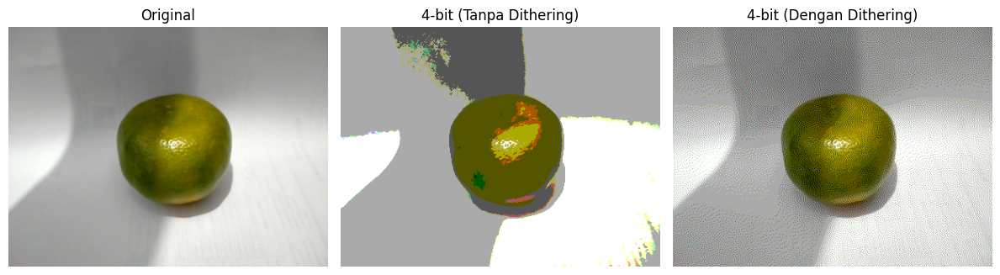


  → Bit Depth 5-bit (≈ 8 warna/channel)
    MSE Tanpa Dithering : 124.89
    MSE Dengan Dithering: 218.59
    PSNR Tanpa Dithering : 27.17 dB
    PSNR Dengan Dithering: 24.73 dB


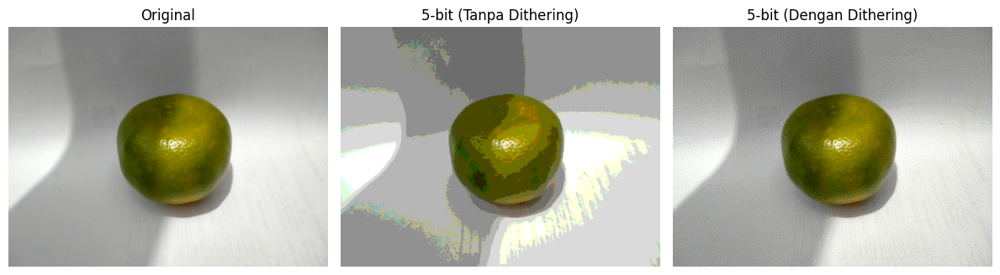


  → Bit Depth 6-bit (≈ 16 warna/channel)
    MSE Tanpa Dithering : 23.97
    MSE Dengan Dithering: 42.74
    PSNR Tanpa Dithering : 34.33 dB
    PSNR Dengan Dithering: 31.82 dB


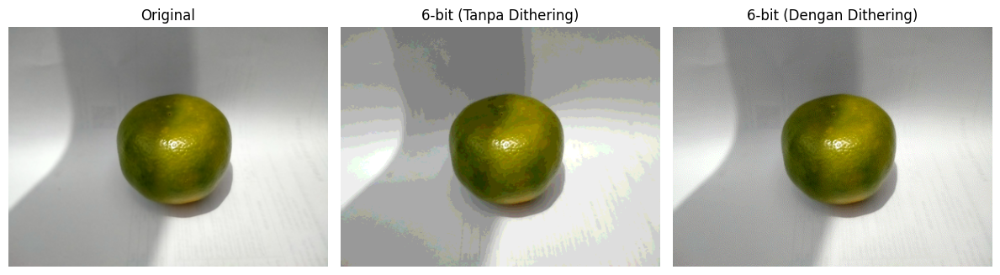


✅ Selesai memproses 6 gambar yang dipilih. Hasil disimpan di: /content/drive/MyDrive/PCVK/Output Dither/


In [14]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import math
import os

# === Konfigurasi dasar ===
GREYSCALE = False
folder_path = '/content/drive/MyDrive/PCVK/Gambar Tugas Kelompok/'
output_folder = '/content/drive/MyDrive/PCVK/Output Dither/'

# 💡 Pilih gambar yang ingin diproses
# Pastikan nama file-nya sama persis (case sensitive!)
selected_files = [
    'lokam lokal .jpg',
    'lokam lokal bayangan.jpg',
    'lokam lokal gelap.jpg',
    'siam madu.jpg',
    'siam madu gelap.jpg',
    'siam madu bayangan.jpg'
]

# Buat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# === Fungsi bantu ===
def get_new_val(old_val, nc):
    """Mendapatkan nilai warna baru terdekat dalam rentang nc level."""
    return np.round(old_val * (nc - 1)) / (nc - 1)

def fs_dither(img, nc):
    """Floyd–Steinberg Dithering untuk nc warna per channel."""
    arr = np.array(img, dtype=float) / 255.0
    h, w = arr.shape[:2]

    for y in range(h):
        for x in range(w):
            old_val = arr[y, x].copy()
            new_val = get_new_val(old_val, nc)
            arr[y, x] = new_val
            err = old_val - new_val

            if x + 1 < w:
                arr[y, x + 1] += err * 7 / 16
            if y + 1 < h:
                if x > 0:
                    arr[y + 1, x - 1] += err * 3 / 16
                arr[y + 1, x] += err * 5 / 16
                if x + 1 < w:
                    arr[y + 1, x + 1] += err * 1 / 16

    arr = np.clip(arr, 0, 1)
    carr = np.array(arr * 255, dtype=np.uint8)
    return Image.fromarray(carr)

def palette_reduce(img, nc):
    """Reduksi warna sederhana tanpa dithering."""
    arr = np.array(img, dtype=float) / 255.0
    arr = get_new_val(arr, nc)
    carr = np.array(arr * 255, dtype=np.uint8)
    return Image.fromarray(carr)

def mse(img1, img2):
    a1 = np.array(img1, dtype=float)
    a2 = np.array(img2, dtype=float)
    return np.mean((a1 - a2) ** 2)

def psnr(img1, img2):
    m = mse(img1, img2)
    if m == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(m))

# === Eksekusi untuk gambar terpilih ===
bit_depths = [4, 5, 6]

for file_name in selected_files:
    img_path = os.path.join(folder_path, file_name)
    if not os.path.exists(img_path):
        print(f"⚠️ File tidak ditemukan: {file_name}")
        continue

    print(f"\n=== Memproses: {file_name} ===")
    img = Image.open(img_path)
    if GREYSCALE:
        img = img.convert('L')

    # Resize biar seragam
    width, height = img.size
    new_width = 400
    new_height = int(height * new_width / width)
    img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)

    for bit in bit_depths:
        nc = 2 ** (bit - 2)  # jumlah warna per channel kira-kira
        print(f"\n  → Bit Depth {bit}-bit (≈ {nc} warna/channel)")

        dithered = fs_dither(img, nc)
        reduced = palette_reduce(img, nc)

        # Simpan hasil ke folder output
        base_name = os.path.splitext(file_name)[0]
        dithered.save(os.path.join(output_folder, f"{base_name}_dither_{bit}bit.jpg"))
        reduced.save(os.path.join(output_folder, f"{base_name}_reduced_{bit}bit.jpg"))

        m1 = mse(img, reduced)
        m2 = mse(img, dithered)
        p1 = psnr(img, reduced)
        p2 = psnr(img, dithered)

        print(f"    MSE Tanpa Dithering : {m1:.2f}")
        print(f"    MSE Dengan Dithering: {m2:.2f}")
        print(f"    PSNR Tanpa Dithering : {p1:.2f} dB")
        print(f"    PSNR Dengan Dithering: {p2:.2f} dB")

        # === Visualisasi ===
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(reduced)
        plt.title(f"{bit}-bit (Tanpa Dithering)")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(dithered)
        plt.title(f"{bit}-bit (Dengan Dithering)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

print(f"\n✅ Selesai memproses {len(selected_files)} gambar yang dipilih. Hasil disimpan di: {output_folder}")

# Bagian B – Analisis

## 1. Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram citra gelap?

**Jawaban:**

Perubahan nilai brightness (β) dan contrast (α) secara langsung memengaruhi posisi serta bentuk histogram pada citra gelap.
Ketika brightness ditingkatkan (β > 0), seluruh nilai intensitas piksel bergeser ke kanan — area gelap menjadi lebih terang, dan detail yang sebelumnya tidak terlihat mulai muncul.
Sementara itu, peningkatan contrast (α > 1) membuat histogram menjadi lebih lebar: piksel gelap menjadi lebih gelap dan piksel terang menjadi lebih terang, sehingga perbedaan antar area citra tampak lebih jelas.

Sebaliknya, jika nilai brightness terlalu tinggi atau contrast berlebihan, histogram akan menumpuk di sisi kanan (overexposed) dan kehilangan detail halus.
Jadi, pada citra gelap, peningkatan brightness dan sedikit peningkatan contrast membantu menormalkan distribusi intensitas agar sebaran piksel lebih merata dan citra tampak lebih natural.

## 2. Apakah histogram equalization selalu memperbaiki detail? Jelaskan alasannya dengancontoh hasil Anda.

**Jawaban:**
Histogram equalization tidak selalu memperbaiki detail gambar.
Berdasarkan hasil di atas:

- Sebelum equalization, histogram terkonsentrasi di area nilai intensitas tinggi (sekitar 200–255). Ini artinya gambar cenderung terlalu terang, tapi masih memiliki gradasi halus di objek jeruk.

- Setelah equalization, histogram menjadi lebih menyebar merata, meningkatkan kontras antara latar dan objek. Namun, pada hasil visual terlihat bahwa bagian bayangan jeruk menjadi terlalu gelap dan detail di area terang hilang (over-contrast).

Jadi, meskipun kontras meningkat, tidak semua detail diperbaiki — kadang justru detail halus hilang karena distribusi intensitas terlalu ekstrem.
Histogram equalization paling efektif untuk citra gelap atau low contrast, tetapi untuk gambar yang sudah memiliki pencahayaan cukup baik, hasilnya bisa membuat area terang dan gelap kehilangan informasi penting.

## 3. Bandingkan hasil low-pass dan high-pass filter pada citra — apakah ada pengaruhnya?

**Jawaban:**

Hasil penerapan low-pass filter (Gaussian) dan high-pass filter (Laplacian) menunjukkan pengaruh yang berbeda pada citra:

- Low-pass filter menghasilkan citra lebih halus karena mengurangi noise, tetapi menyebabkan detail tepi menjadi kabur.
- High-pass filter sebaliknya, menonjolkan tepi dan meningkatkan ketajaman citra, namun dapat menimbulkan sedikit noise di area datar.

Dengan membandingkan keduanya, terlihat bahwa low-pass lebih cocok untuk denoising, sedangkan high-pass lebih cocok untuk edge enhancement.
Kombinasi keduanya melalui proses Histogram Equalization + High-pass filter menghasilkan citra paling optimal—detail buah tampak tajam, tetapi tetap natural.

Kesimpulan:
Ya, terdapat pengaruh nyata antara hasil low-pass dan high-pass filter. Low-pass cenderung mengaburkan detail, sedangkan high-pass menajamkan detail. Pada dataset buah dengan pencahayaan tidak merata, gabungan HE + High-pass merupakan pilihan terbaik sebelum tahap deteksi atau klasifikasi.

## 4. Jelaskan pengaruh proses dithering terhadap citra yang Anda miliki?

**Jawaban:**
Proses dithering berpengaruh signifikan terhadap kualitas visual citra setelah dilakukan pengurangan bit depth. Pada citra tanpa dithering, terlihat munculnya area warna yang terpisah jelas (color banding) dan hilangnya gradasi halus pada permukaan objek maupun latar belakang. Namun, setelah diterapkan dithering, distribusi kesalahan kuantisasi membuat transisi antarwarna menjadi lebih lembut dan detail citra tampak lebih alami. Meskipun citra dengan dithering sedikit lebih bertekstur atau berbintik, secara keseluruhan hasilnya lebih mendekati citra asli, yang juga ditunjukkan oleh nilai MSE yang lebih rendah dan PSNR yang lebih tinggi dibandingkan tanpa dithering.

## 5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk meningkatkan detail citra sebelum tahap deteksi?

**Jawaban:**
1. Transformasi brightness dan contrast
2. Histogram equalization untuk memperbaiki sebaran kontras
3. Lowpass filter

# Bagian C – Implementasi (Python–OpenCV)

## Function **BC Brightness & Contrast**

In [20]:
import cv2
import numpy as np

def brighness_contrast(image, a=1.2, b=30):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)
  return img_bc

    # # Konversi brightness dan contrast ke skala yang sesuai
    # brightness = int((brightness / 100) * 255)
    # contrast = int((contrast / 100) * 127)

    # # Hitung faktor alpha (kontras) dan beta (kecerahan)
    # if contrast > 0:
    #     alpha = 1 + (contrast / 127)
    # else:
    #     alpha = 1 + (contrast / 127)
    # beta = brightness

    # # Terapkan perubahan menggunakan OpenCV
    # adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

    # return adjusted_image

## Funciton **HE Histogram Equalization**

In [23]:
# ============================================
# 🎨 BAGIAN A.3 – HISTOGRAM EQUALIZATION (Hanya Fungsi)
# ============================================
# Penulis: Nadia
# Tujuan: Melakukan Histogram Equalization pada semua gambar di folder
# dan menampilkan histogram sebelum & sesudah
# ============================================

import cv2
import matplotlib.pyplot as plt
import os

# Fungsi untuk histogram equalization without displaying images
def histogram_equalization_only(image):
    # Convert image to grayscale
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Redundant grayscale conversion removed

    # Apply Histogram Equalization
    img_he = cv2.equalizeHist(image) # Apply directly to the input image

    return img_he

## Function **Spatial Filtering**

In [27]:
# ============================================
# 🧩 BAGIAN A.4 – SPATIAL FILTERING (Return 2 hasil)
# ============================================
# Penulis: Nadia
# Tujuan: Menerapkan filter spasial (low-pass & high-pass) dan mengembalikan hasilnya
# ============================================

import cv2
import numpy as np

def spatial_filtering(image, alpha=1.3, beta=30):
    # 1️⃣ Convert image to grayscale
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Redundant grayscale conversion removed

    # 2️⃣ Brightness & Contrast
    # img_bc = cv2.convertScaleAbs(gray, alpha=alpha, beta=beta) # BC should be applied before HE

    # 3️⃣ Histogram Equalization
    # img_he = cv2.equalizeHist(img_bc) # HE should be applied after BC

    # The input 'image' is already expected to be the output of HE (which is grayscale)
    img_processed = image

    # 4️⃣ Low-pass Filter (Gaussian)
    low_pass = cv2.GaussianBlur(img_processed, (5,5), 0)

    # 5️⃣ High-pass Filter (Laplacian)
    high_pass = cv2.Laplacian(img_processed, cv2.CV_64F)
    high_pass = cv2.convertScaleAbs(high_pass)

    # 6️⃣ Return two results (low and high)
    return low_pass, high_pass

## Function **Dithered**

In [18]:
#  Kode disini

def dithered(image):
    # Ensure the image is in grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image.copy()

    # Convert to float for calculation accuracy
    img = gray.astype(float)

    # Floyd–Steinberg Dithering
    for y in range(img.shape[0] - 1):
        for x in range(1, img.shape[1] - 1):
            old_pixel = img[y, x]
            new_pixel = 255 if old_pixel > 127 else 0
            img[y, x] = new_pixel
            quant_error = old_pixel - new_pixel

            # Propagate error to neighboring pixels
            img[y, x + 1] += quant_error * 7 / 16
            img[y + 1, x - 1] += quant_error * 3 / 16
            img[y + 1, x] += quant_error * 5 / 16
            img[y + 1, x + 1] += quant_error * 1 / 16

    # Ensure values are within 0-255 range
    img = np.clip(img, 0, 255)

    return img.astype(np.uint8)

## Tampilkan hasil 4 tahap (asli → BC → HE → Filter → Dithered).


🖼️ Proses gambar: siam madu.jpg


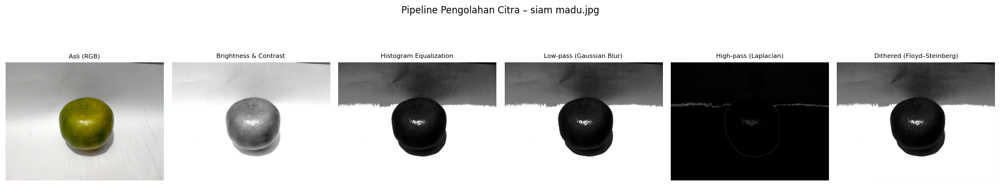


🖼️ Proses gambar: siam madu bayangan.jpg


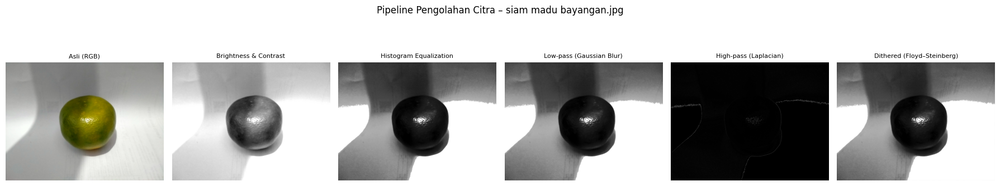


🖼️ Proses gambar: lokam lokal bayangan.jpg


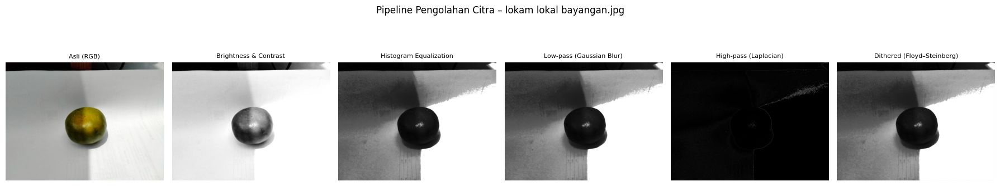


🖼️ Proses gambar: lokam lokal .jpg


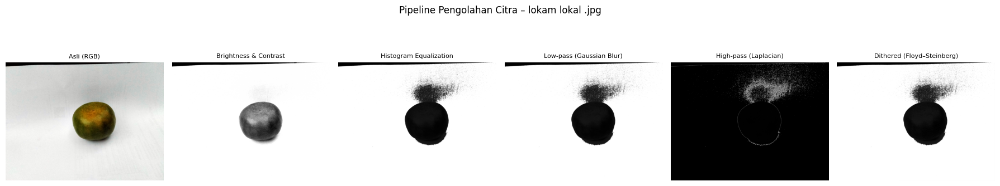


🖼️ Proses gambar: siam madu gelap.jpg


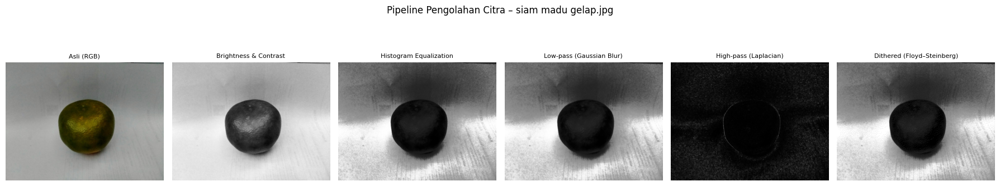


🖼️ Proses gambar: lokam lokal gelap.jpg


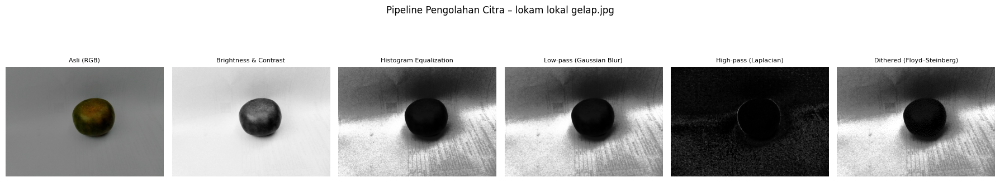

In [28]:
# ============================================
# 🚀 PROSES SEMUA GAMBAR
# ============================================
for file in os.listdir(folder_path):
    if file.lower().endswith(('.jpg', '.jpeg', '.png')):
        full_path = os.path.join(folder_path, file)
        print(f"\n🖼️ Proses gambar: {file}")

        # 1️⃣ Gambar asli
        original = cv2.imread(full_path)
        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        # 2️⃣ Brightness & Contrast
        bc = brighness_contrast(original, a=1.2, b=30)

        # 3️⃣ Histogram Equalization
        # Pass the 'original' image array, not the path
        he = histogram_equalization_only(bc)

        # 4️⃣ Spatial Filtering
        # Pass the 'original' image array, not the path
        low, high = spatial_filtering(he)

        # 5️⃣ Dithered
        # Pass the 'original' image array, not the path
        dith = dithered(low)

        # ============================================
        # 🔍 Tampilkan semua hasil menyamping
        # ============================================
        plt.figure(figsize=(18,4))
        plt.suptitle(f'Pipeline Pengolahan Citra – {file}', fontsize=12)

        images = [original_rgb, bc, he, low, high, dith]
        titles = ['Asli (RGB)', 'Brightness & Contrast', 'Histogram Equalization',
                  'Low-pass (Gaussian Blur)', 'High-pass (Laplacian)', 'Dithered (Floyd–Steinberg)']

        for i in range(len(images)):
            plt.subplot(1,6,i+1)
            cmap = 'gray' if len(images[i].shape) == 2 else None
            plt.imshow(images[i], cmap=cmap)
            plt.title(titles[i], fontsize=8)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

# Bagian D – Analisis Akhir & Kesimpulan